# Notebook showing a fast and efficient way to load Sentinel-2 L1C data into xarray

In [1]:
import glob
import os
import numpy as np

import pandas as pd
import geopandas as gpd
import xarray as xr
import rioxarray

import matplotlib.pyplot as plt
import matplotlib as mpl
import cartopy.crs as ccrs
from matplotlib.colors import ListedColormap

import memory_profiler

from eoreader.keywords import CLEAN_OPTICAL
%load_ext memory_profiler

from eoreader.reader import Reader
import s2driver
from s2driver import visual
opj = os.path.join

s2driver.__version__

'1.0.3'

Set the path of the images you want to load, here is a example for the former (v3) and current (v4) image formatting 

In [2]:
image ='/data/satellite/landsat/LC09_L1TP_196030_20221120_20230321_02_T1'

In [3]:
l1c =s2driver.landsat_driver(image)

In [4]:
l1c.INFO

bandId,0,1,2,3,4,5,6,7,8
ESA,B01,B02,B03,B08,B04,B05,B09,B06,B07
EOREADER,CA,BLUE,GREEN,PAN,RED,NIR,SWIR_CIRRUS,SWIR_1,SWIR_2
Wavelength (nm),443,490,560,590,665,865,1370,1610,2190
Band width (nm),25,60,60,173,33,28,21,95,287
Resolution (m),30,30,30,15,30,30,30,30,30


In [5]:
l1c.load_mask()

In [6]:
%time %memit l1c.load_product()

/home/harmel/anaconda3/envs/grstbx/lib/python3.9/site-packages/xarray/core/indexes.py:659: RuntimeWarning: '<' not supported between instances of 'SpectralBandNames' and 'SpectralBandNames', sort order is undefined for incomparable objects.
  new_pd_index = pd_indexes[0].append(pd_indexes[1:])


peak memory: 7935.54 MiB, increment: 6552.73 MiB
CPU times: user 1min 43s, sys: 17.7 s, total: 2min
Wall time: 1min 3s


In [7]:
l1c.prod.

<xarray.Dataset>
Dimensions:      (x: 7671, y: 7791, wl: 9, wl_hr: 1950)
Coordinates:
  * x            (x) float64 5.349e+05 5.349e+05 5.35e+05 ... 7.65e+05 7.65e+05
  * y            (y) float64 4.899e+06 4.899e+06 ... 4.666e+06 4.666e+06
    spatial_ref  int64 0
  * wl           (wl) object 443 490 560 590 665 865 1370 1610 2190
  * wl_hr        (wl_hr) float64 400.0 401.0 402.0 ... 2.348e+03 2.349e+03
    band         int64 1
Data variables:
    bands        (wl, y, x) float32 nan nan nan nan nan ... nan nan nan nan nan
    SRF          (wl, wl_hr) float64 ...
    wl_true      (wl) float64 442.8 482.3 560.9 ... 1.608e+03 2.201e+03
    sza          (y, x) float32 nan nan nan nan nan nan ... nan nan nan nan nan
    vza          (y, x) float32 nan nan nan nan nan nan ... nan nan nan nan nan
    raa          (y, x) float32 nan nan nan nan nan nan ... nan nan nan nan nan
    l1c_flag     (y, x) uint32 1 1 1 1 1 1 1 1 1 1 1 1 ... 1 1 1 1 1 1 1 1 1 1 1
Attributes: (12/16)
    long_name:              CA BLUE GREEN PAN RED NIR SWIR_CIRRUS SWIR_1 SWIR_2
    constellation:          Landsat-9
    constellation_id:       L9
    product_path:           /data/satellite/landsat/LC09_L1TP_196030_20221120...
    product_name:           LC09_L1TP_196030_20221120_20230321_02_T1
    product_filename:       LC09_L1TP_196030_20221120_20230321_02_T1
    ...                     ...
    orbit_direction:        DESCENDING
    radiometry:             reflectance
    cloud_cover:            0.2
    satellite:              Landsat-9
    solar_irradiance:       NA
    solar_irradiance_unit:  W/m²/µm

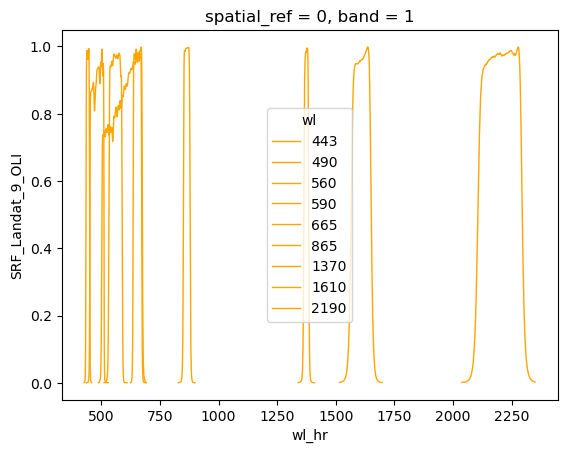

In [9]:
l1c.prod.SRF.plot(x='wl_hr',hue='wl',color='orange',lw=1)

In [ ]:
l1c.prod

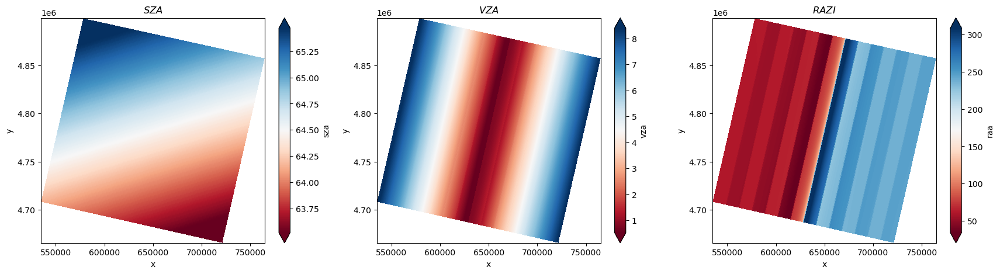

In [8]:
coarsening=3
fig, axs = plt.subplots(ncols=3,figsize=(21,5))
(l1c.prod.sza[::coarsening, ::coarsening]).plot.imshow(ax=axs[0],cmap=plt.cm.RdBu, robust=True)
axs[0].set_title('$SZA$')
l1c.prod.vza[::coarsening, ::coarsening].plot.imshow(ax=axs[1],cmap=plt.cm.RdBu, robust=True)
axs[1].set_title('$VZA$')
l1c.prod.raa[::coarsening, ::coarsening].plot.imshow(ax=axs[2],cmap=plt.cm.RdBu, robust=True)
axs[2].set_title('$RAZI$')
plt.show()


In [10]:
coarsening=5
(l1c.prod.bands.where(mask.l1c_flag ==21824).l1c_flag[::coarsening, ::coarsening]*0.001).plot.imshow(cmap=plt.cm.Spectral_r,vmax=25,robust=False)

NameError: name 'mask' is not defined

In [ ]:
def bitmask(mask, bitval, value=True):
    """

    """

    if value:
        mask |= bitval
    else:
        mask &= (~bitval)
    return mask
mask=7
bitval=6
bitmask(mask,bitval)

129


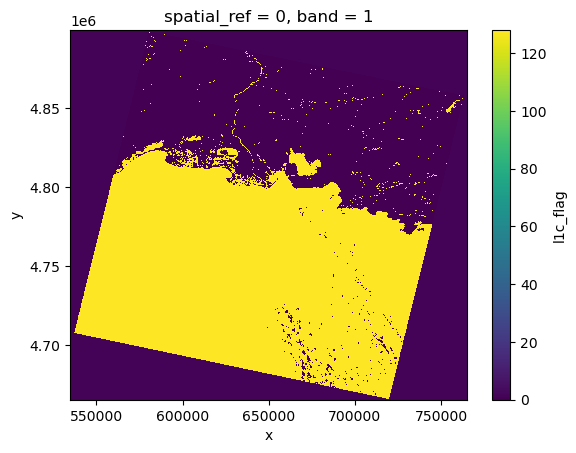

In [9]:
coarsening=5
#apply the first 5 flags
value = int('11111', 2)
# water mask
#value = int('10000001', 2)
print(value)
(l1c.prod.l1c_flag & value).plot.imshow()

31


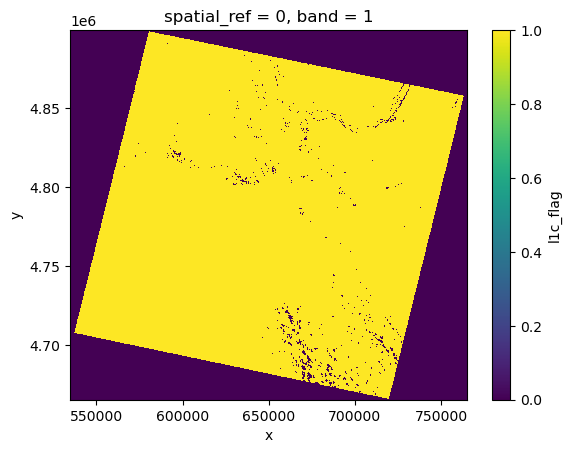

In [38]:
coarsening=5
#apply the first 5 flags
value = int('11111', 2)
print(value)
maskout=(l1c.prod.l1c_flag & value == 0) #[::coarsening, ::coarsening].plot()#values = np.unique(mask.l1c_flag.values)
maskout[::coarsening, ::coarsening].plot.imshow()

In [12]:
maskout

<xarray.DataArray 'l1c_flag' (y: 7791, x: 7671)>
array([[False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       ...,
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False]])
Coordinates:
  * x            (x) float64 5.349e+05 5.349e+05 5.35e+05 ... 7.65e+05 7.65e+05
  * y            (y) float64 4.899e+06 4.899e+06 ... 4.666e+06 4.666e+06
    spatial_ref  int64 0
    band         int64 1

In [13]:
raster=l1c.prod.bands.where(maskout) #[:, ::coarsening, ::coarsening].sel(wl=[665,560,490],method='nearest')**0.5).plot.imshow(rgb='wl', robust=True,subplot_kws=dict(projection=proj))

In [14]:
h=visual.view_geo(raster.assign_coords(time=l1c.datetime).expand_dims('time'),reproject=True)

In [15]:
h.visu()

Column
    [0] WidgetBox
        [0] Markdown(str)
        [1] Column
            [0] Row
                [0] Row
                    [0] Markdown(str)
                    [1] RadioButtonGroup(options=[0, 1, 2, 3, 4, ...], value=0)
                [1] Row
                    [0] Markdown(str)
                    [1] DatePicker(enabled_dates=[datetime.date(2022, ...], start=datetime.date(2022, ..., value=datetime.date(2022, ...)
                [2] Row
                    [0] Markdown(str)
                    [1] Select(options=['CartoDark', ...], value='StamenTerrainRetina')
            [1] Row
                [0] Row
                    [0] Markdown(str)
                    [1] RangeSlider(name='Range Slider', step=0.0001, value=(0, 0.5), value_end=0.5)
                [1] Row
                    [0] Markdown(str)
                    [1] FloatSlider(name='Opacity', step=0.05, value=0.95)
                [2] Row
                    [0] Markdown(str)
                    [1] Select(options=['CET_D13', 'bky', ...], value='CET_D13')
    [1] HoloViews(DynamicMap, height=700, sizing_mode='fixed', width=1200)

In [16]:
import cartopy.crs as ccrs

epsg = l1c.extent.crs.to_epsg()
str_epsg = str(epsg)
zone = str_epsg[-2:]
is_south = str_epsg[2] == 7
proj = ccrs.UTM(zone, is_south)

In [24]:
# Get geographic projection and bounds
extent = l1c.extent
bounds = extent.bounds
extent_val = [bounds.minx[0]+40000, bounds.maxx[0]-30000, bounds.miny[0]+10000, bounds.maxy[0]-65000]


Text(0.5, 1.0, '')

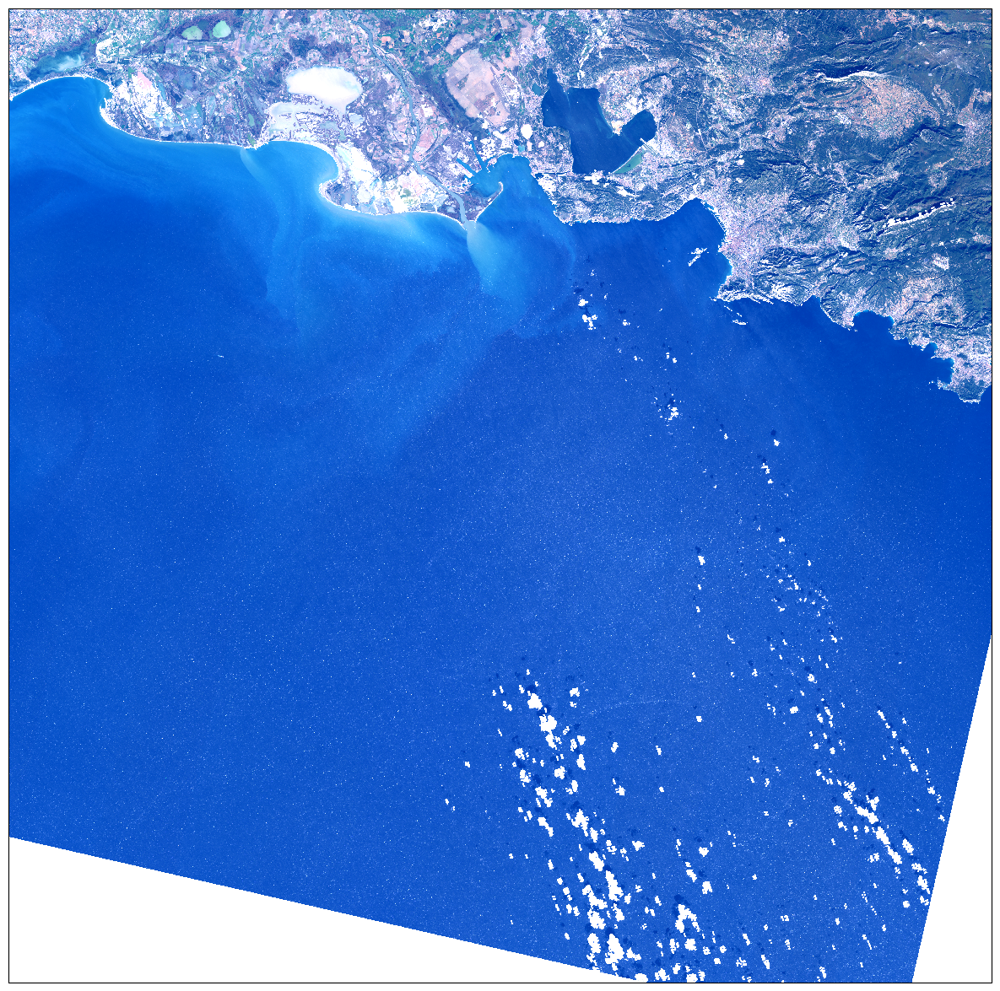

In [25]:
fig = plt.figure(figsize=(20, 15))
ax = plt.subplot(1, 1, 1, projection=proj)
ax.set_extent(extent_val, proj)
coarsening=1
brightness_factor = 3.5
(raster[:, ::coarsening, ::coarsening].sel(wl=[665,560,490],method='nearest')**0.5
).squeeze().plot.imshow(rgb='wl', robust=True,subplot_kws=dict(projection=proj))
ax.set_title('')

In [26]:
# Compute NDWI
blue = raster.sel(wl=443,method='nearest')
green = raster.sel(wl=565,method='nearest')
nir = raster.sel(wl=865,method='nearest')
swir = raster.sel(wl=1600,method='nearest')
b2200 = raster.sel(wl=2190,method='nearest')

ndwi = (green - nir) / (green + nir)
ndwi_swir = (blue - swir) / (blue + swir)



In [27]:
bounds

,minx,miny,maxx,maxy
0,534885.0,4665585.0,765015.0,4899315.0


In [28]:
ncols=2
nrows=4
#coarsening to save memory and speed
coarsening=5
sunglint_threshold = 0.2
ndwi_threshold = 0.01
green_swir_index_threshold = 0.1
hcld_threshold = 3e-3

# Get geographic projection and bounds
#extent = prod.extent
#proj = prod.proj
#bounds = extent.bounds
#extent_val = [bounds.minx[0]+20000, bounds.maxx[0]-3000, bounds.miny[0], bounds.maxy[0]-50000]

# binary cmap
bcmap = ListedColormap(['khaki', 'lightblue'])


def water_mask(ndwi, threshold=0):
    water = xr.where(ndwi > threshold, 1, 0)
    return water.where(~np.isnan(ndwi))

def plot_water_mask(ndwi,ax,threshold=0):
    water = water_mask(ndwi, threshold)
    ax.set_extent(extent_val, proj)
    water.plot.imshow(extent=extent_val, transform=proj, cmap=bcmap,
                                  cbar_kwargs={'ticks': [0, 1], 'shrink': shrink})
    ax.set_title(str(threshold)+' < NDWI')

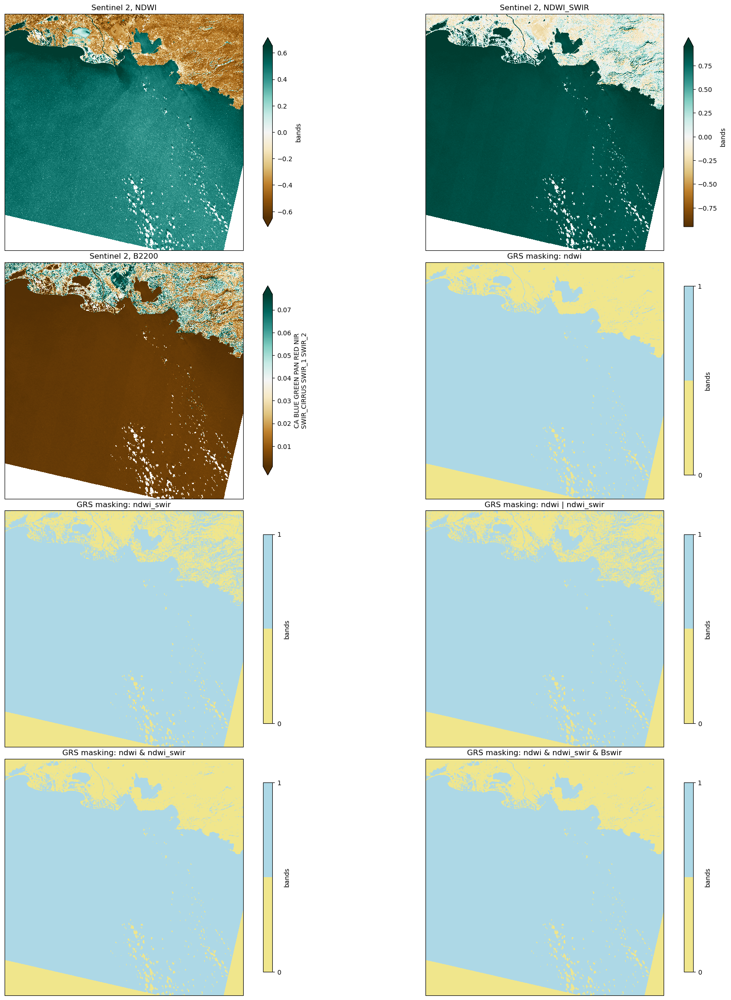

In [29]:
fig = plt.figure(figsize=(20, 25))
fig.subplots_adjust(bottom=0.1, top=0.95, left=0.1, right=0.99,
                    hspace=0.05, wspace=0.05)
shrink = 0.8
ii=1
# NDWI    
ax = plt.subplot(nrows,ncols, ii, projection=proj)
ax.set_extent(extent_val, proj)
fig = ndwi[::coarsening, ::coarsening].plot.imshow(extent=extent_val, transform=proj, cmap=plt.cm.BrBG, robust=True,
                                   cbar_kwargs={'shrink': shrink})
ax.set_title('Sentinel 2, NDWI')
ii+=1

# NDWI_SWIR    
ax = plt.subplot(nrows,ncols, ii, projection=proj)
ax.set_extent(extent_val, proj)
fig = ndwi_swir[::coarsening, ::coarsening].plot.imshow(extent=extent_val, transform=proj, cmap=plt.cm.BrBG, robust=True,
                                   cbar_kwargs={'shrink': shrink})
ax.set_title('Sentinel 2, NDWI_SWIR')
ii+=1


# B2200
ax = plt.subplot(nrows,ncols, ii, projection=proj)
ax.set_extent(extent_val, proj)
fig = b2200[::coarsening, ::coarsening].plot.imshow(extent=extent_val, transform=proj, cmap=plt.cm.BrBG, robust=True,
                                   cbar_kwargs={'shrink': shrink})
ax.set_title('Sentinel 2, B2200')
ii+=1


ax = plt.subplot(nrows,ncols, ii, projection=proj)
water = xr.where((ndwi > ndwi_threshold),1,0) # &  
ax.set_extent(extent_val, proj)
water.plot.imshow(extent=extent_val, transform=proj, cmap=bcmap,
                              cbar_kwargs={'ticks': [0, 1], 'shrink': shrink})
ax.set_title('GRS masking: ndwi')
ii+=1


ax = plt.subplot(nrows,ncols, ii, projection=proj)
water = xr.where((ndwi_swir > green_swir_index_threshold),1,0) # &  
ax.set_extent(extent_val, proj)
water.plot.imshow(extent=extent_val, transform=proj, cmap=bcmap,
                              cbar_kwargs={'ticks': [0, 1], 'shrink': shrink})
ax.set_title('GRS masking: ndwi_swir')
ii+=1



ax = plt.subplot(nrows,ncols, ii, projection=proj)
water = xr.where((ndwi > ndwi_threshold)| (ndwi_swir > green_swir_index_threshold),1,0) # &  
ax.set_extent(extent_val, proj)
water.plot.imshow(extent=extent_val, transform=proj, cmap=bcmap,
                              cbar_kwargs={'ticks': [0, 1], 'shrink': shrink})
ax.set_title('GRS masking: ndwi | ndwi_swir')
ii+=1


ax = plt.subplot(nrows,ncols, ii, projection=proj)
water = xr.where(((ndwi > ndwi_threshold) & (ndwi_swir > green_swir_index_threshold)) ,1,0) # &  
ax.set_extent(extent_val, proj)
water.plot.imshow(extent=extent_val, transform=proj, cmap=bcmap,
                              cbar_kwargs={'ticks': [0, 1], 'shrink': shrink})
ax.set_title('GRS masking: ndwi & ndwi_swir')
ii+=1


ax = plt.subplot(nrows,ncols, ii, projection=proj)
water = xr.where(((ndwi > ndwi_threshold)& (ndwi_swir > green_swir_index_threshold)) & (b2200 < sunglint_threshold),1,0) # &  
ax.set_extent(extent_val, proj)
water.plot.imshow(extent=extent_val, transform=proj, cmap=bcmap,
                              cbar_kwargs={'ticks': [0, 1], 'shrink': shrink})
ax.set_title('GRS masking: ndwi & ndwi_swir & Bswir')

plt.show()

Text(0.5, 1.0, '')

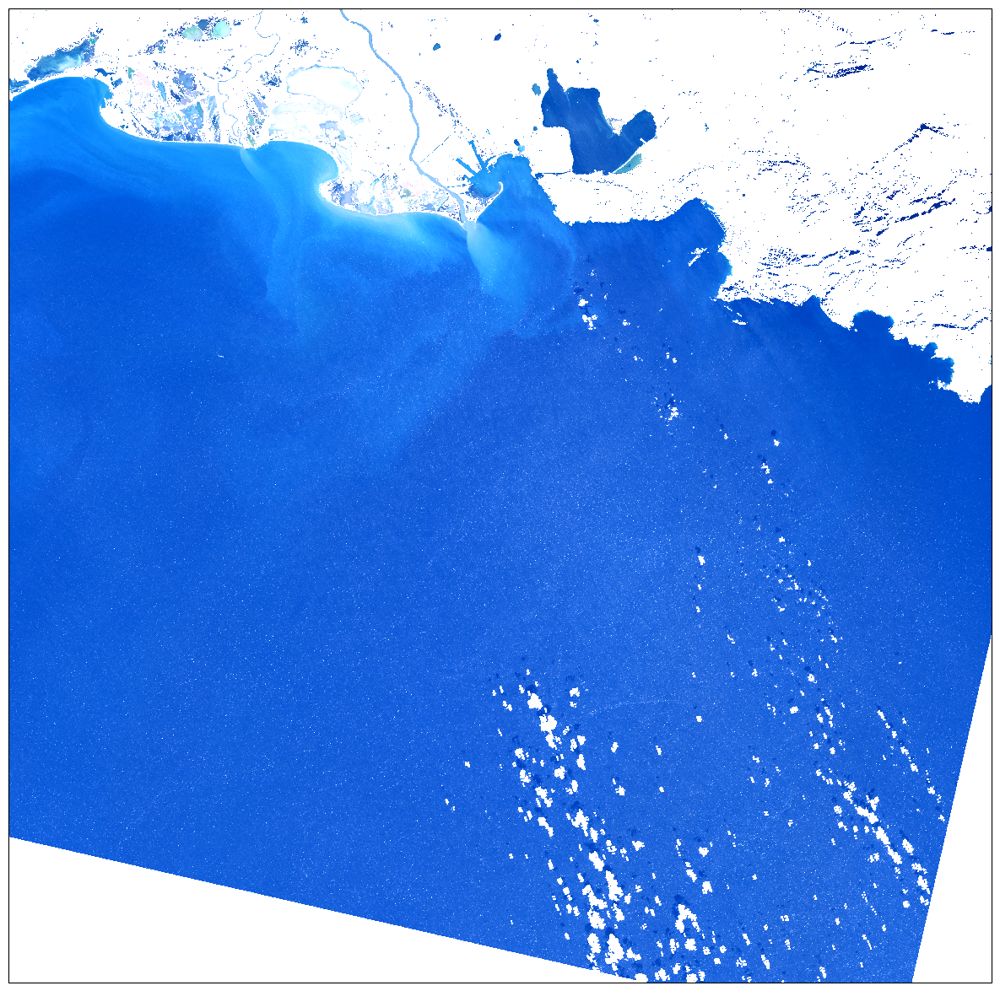

In [30]:

fig = plt.figure(figsize=(20, 15))
ax = plt.subplot(1, 1, 1, projection=proj)
ax.set_extent(extent_val, proj)
coarsening=1
brightness_factor = 3.5
(raster.where(water)[:, ::coarsening, ::coarsening].sel(wl=[665,560,490],method='nearest')**0.5
).squeeze().plot.imshow(rgb='wl', robust=True,subplot_kws=dict(projection=proj))
ax.set_title('')

In [1]:
fig = plt.figure(figsize=(20, 15))
ax = plt.subplot(1, 1, 1, projection=proj)
ax.set_extent(extent_val, proj)
coarsening=2
raster.bands.where(water)[:, ::coarsening, ::coarsening].sel(wl=[1350],method='nearest').squeeze().plot.imshow( robust=True,subplot_kws=dict(projection=proj))

NameError: name 'plt' is not defined

In [2]:
fig = plt.figure(figsize=(20, 15))
ax = plt.subplot(1, 1, 1, projection=proj)
ax.set_extent(extent_val, proj)
coarsening=5
brightness_factor = 3.5
(raster.bands[:, ::coarsening, ::coarsening].sel(wl=[2200,1600,866],method='nearest')**0.5**brightness_factor
).plot.imshow(rgb='wl', robust=True,subplot_kws=dict(projection=proj))

NameError: name 'plt' is not defined